# INTRODUCTION
**Author: Antoine Dumont Neira**

**Last Update: August 2024**

This is an example notebook with the basic setup required to run WICKED. WIWCKED can on the three NIRSpec long pass filters; F100LP, F170LP and F290LP, and for data taken with single or multiple NRS detectors. I have tested WICKED to correct for Moire patterns or "Wiggles" on high-z Quasars, Low-luminosity AGNS, Stars and exoplanets, obtaining satisfactory results on all of them.

Here are the main things to understand about WICKED:

1. The model for the wiggles consist of multiple sinudoidal fits of the form f(x) = $A\times \cos(2 \pi f_{\omega} + \phi)$. The spectrum is divided into many smaller chunks based on local maxima and minima (of the wiggle signal) but usually of the order of $\sim 0.1-0.2 \mu m$.

2. The reference spectrum, or in other words, the model of how the spectrum would look without wiggles is modeleded with a combination of an annular integrated spectrum, a central integraed spectrum, a power-law and a 2nd degree polynomial. This ensures that we can model corretly for changing on the slope of the continuum and equivalent width of stellar/gas features between the model and the data at different radii. This is esential to obtain a "wiggle" spectrum as close to flat as possible, since our sinusoidal model does not includes a continuum, since when the wiggle model and the original spectrum are suubstracted this will alter the shape of the continuum. 

3. How we identify the pixels affected by wiggles. WICKED  flaggs pixels affected by wiggles based on their Fourier Transform. The frequewncy of wiggles is fairly stable for different type of data, presenting large peaks on frequncies of 5-50 $[1/\mu m]$. WICKED compares the mean of the Fourier transform in each pixel at the frequency range of the wiggles with the mean at larger frequencies. The range of frequencies of wiggles is based on the polynomial fit done for the central, brigthest pixel. In other words, it is unique for each datacube. 

4. WICKED is easy to use and fully parallelized. Usual usage time is between 30-60 minutes depending on the datacube and the available number (**N_cores** ) of CPU availables.


## **STEP 0**: SETUP BASIC PARAMETERS

Setup basic information, such as redshift, jwst filter, path to rhe datacube, etc

In [1]:
run WiCKED.py

In this example I run WICKED on a M-type star available on the MAST portal. The data was taken for the proposal "Characterizing the TWA 27 system" by the PI: Birkmann, Stephan

In [2]:
pathcube_input= "/Users/dumont/Documents/ReveaLLGN/DATA/TWA-28/MAST_2024-07-24T2034/JWST/jw01270-o004_t003_nirspec_g235h-f170lp/"
cube_input  = "jw01270-o004_t003_nirspec_g235h-f170lp_s3d.fits"
z = 0.0
fit_wiggles_170lp = WICKED(pathcube=pathcube_input,cube_path=cube_input,redshift=z)


### Find the center of the datacube

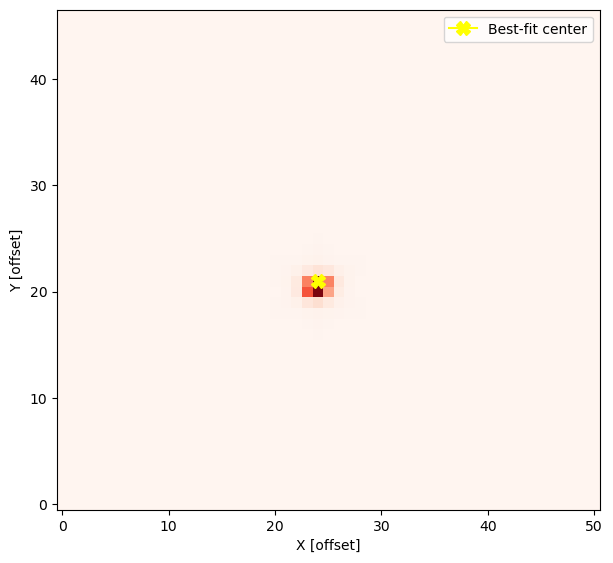


 Center is  x, y =  24 21


In [3]:
fit_wiggles_170lp.get_center(do_plots=True)

#### **MASK BAD REGIONS** 
The code performs automated emission line detection. The user can define the minimum S/N and width (in pixels) to flag an emission line. Additionally, the user can also provide a file named **"you_lines.dat"** that contains known emission and absorption lines. Please see either QuasarLines.dat or CObandheads.dat file in the repository on how to make a list of lines. The lines must be in rest frame and in vacuum. 

Here is a quick example of the parameters you can define to get a better fit:

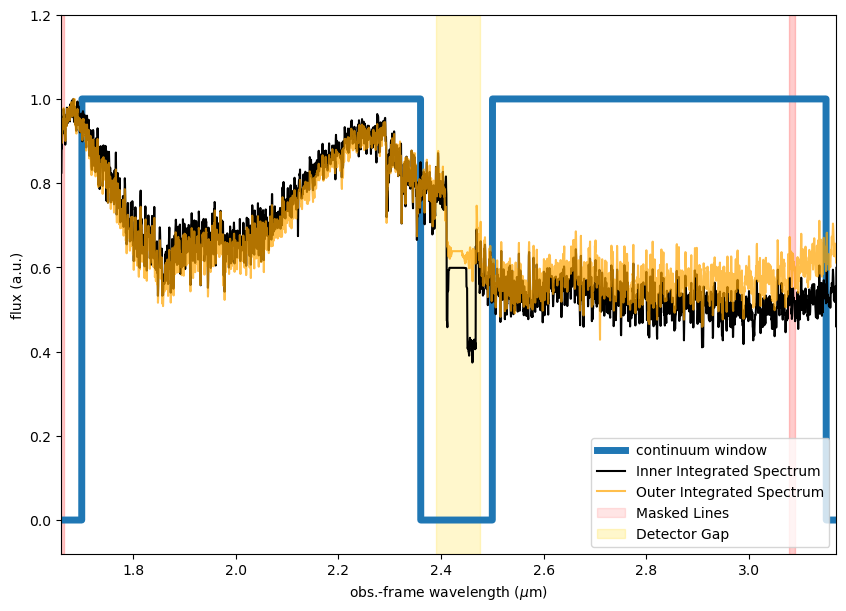

In [4]:
fit_wiggles_170lp.min_peak_snr = 10 # Min Signal to noise of line to be masked
fit_wiggles_170lp.peak_width = [5] # Min width in pixels of emission line to be masked
fit_wiggles_170lp.linefeatures = "CObandheads.dat"   ### M-stars have prominent CO bandheads at ~2.3 microns
fit_wiggles_170lp.get_reference_spectrum(in_radius=3,out_radius=6,do_plots=True)


# **STEP 1:** FIT WIGGLES FOR CENTRAL PIXEL

Here I perform the fitting only on the central pixel. This creates a model of the frequencies of the wiggles based on the brightest pixel, then the clearest wiggles. This model will be used later as prior for the Frequewncy fiting for the rest of the pixels in the datacube, but it will get iteratively updated baed on a chi-square threshold for each pixel, to ensure the optimal modeling of the wiggles. 

The user can also quickly modified the initial frequency prior as shown below with
<code> self.frequency_prior = YOUR_GUESS </code>

WICKED will divide the spectrum into different wavelenght chunks based on local maxima and minima of the wiggle array to optimally fit the wiggles. This procedure is repeated **N_rep** times, each time randomly selecting to divide the spectrum between peaks, valley or between peaks and valley. Additionally, WICKED also shift the location of the maxima and minima randomly to fit slightly different wavelenght chunks on each iteration. 

The **green crosses** in the middle pannel are the local Peaks and Valley used to divide the spectrum. 

Constraining frequency trend of wiggles. 

ITERATION 1 OF 2 FINISHED


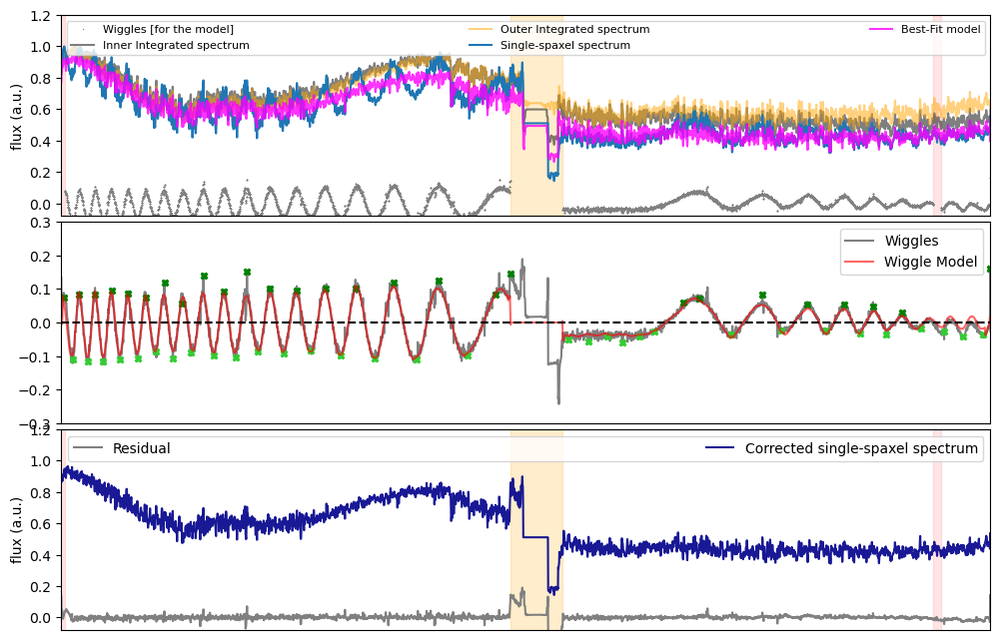

In [5]:
fit_wiggles_170lp.frequency_prior = 40 ### initial frequency prior for the frequency. Normal between 10-50 [1/micron].
fit_wiggles_170lp.FitWigglesCentralPixel(N_rep= 15 ) 


# **STEP 2:** IDENTIFY PIXELS WITH WIGGLES

WICKED evaluates the ratio of the mean amplitude of frequencies associated with wiggles (derived from the central pixel fit) to the standard deviation of amplitudes at longer wavelengths. For pixels affected by wiggles, this ratio exceeds 1-sigma (the threshold ratio "threshold" is defined by the user). In cases where the datacube includes multiple NRS detectors, WICKED performs a Fourier Transform on both and selects the detector where wiggles are most prominent, as determined by the Fourier analysis, to assess whether the spaxel is impacted by wiggles.

By default, the code only searches for wiggles within a circle of radius 10 pixels around the center of the cube. Since wiggles are associated with the central point source, they are not expected to be found at much larger radii.

The second, **smooth_spectrum** is only recommended for lower Signal-to-Noise data where the wiggles can get lost in the noise. when <code>smooth_spectrum="yes" </code> WICKED apply a ~10 pixel mean smooth to the wiggle array, equivalent to ~0.02 microns. 



 GETTING BEST-FIT MODELS FOR EACH PIXEL 

getting best-fit model for task 0 of 305
getting best-fit model for task 1 of 305
getting best-fit model for task 2 of 305
getting best-fit model for task 3 of 305
getting best-fit model for task 4 of 305
getting best-fit model for task 5 of 305
getting best-fit model for task 6 of 305
getting best-fit model for task 7 of 305
getting best-fit model for task 8 of 305
getting best-fit model for task 9 of 305
getting best-fit model for task 10 of 305
getting best-fit model for task 11 of 305
getting best-fit model for task 12 of 305
getting best-fit model for task 13 of 305
getting best-fit model for task 14 of 305
getting best-fit model for task 15 of 305
getting best-fit model for task 16 of 305
getting best-fit model for task 17 of 305
getting best-fit model for task 18 of 305
getting best-fit model for task 19 of 305
getting best-fit model for task 20 of 305
getting best-fit model for task 21 of 305
getting best-fit model for task 22 of 305
g

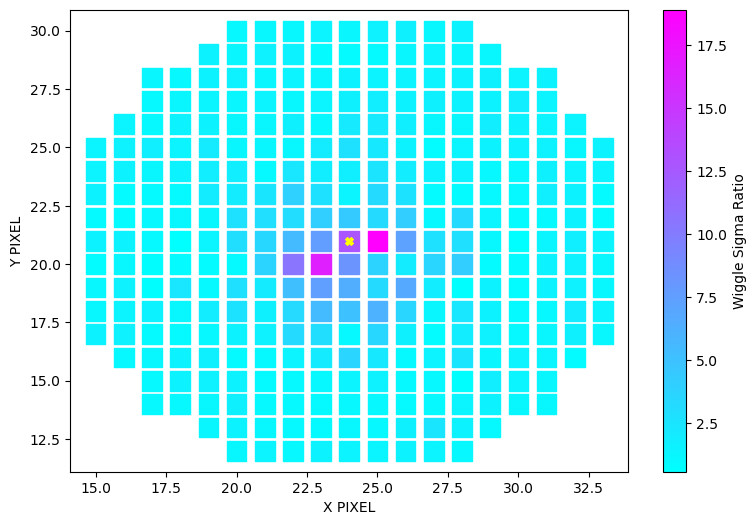

In [6]:
from FIndWiggles import get_wiggly_pixels

results = get_wiggly_pixels(fit_wiggles_170lp, radius=10,N_Cores=7,smooth_spectrum="no",do_plots=True)



## **Examine the FFT to define threshold**

**This step is not mandatory!**

WICKED has a quick function to display all the necesary plots and information for you to make a more informed decidion on the **threshold** ratio that you want to use to flagg pixels affected by wiggles on the next step, <code> define_affected_pixels </code>

In this example I examine the FFT for a pixel that is I suspect it may or may not have wiggles ( far from the center) using **plot_wiggle_FFT**. Based on this I decided a **threshold** of 2.5

 The default "threshold" is 3. 

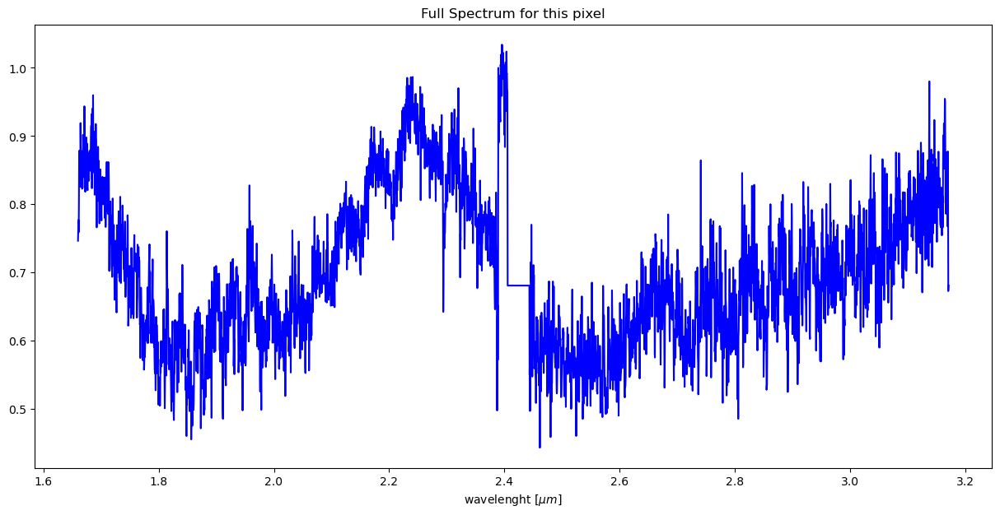


 Sigma Ratio = 2.776


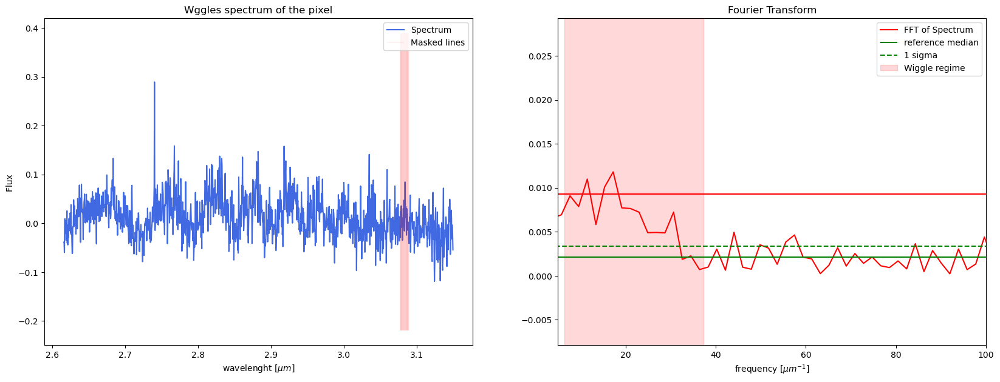

In [14]:
from FIndWiggles import plot_wiggle_FFT
X, Y = 24,25
plot_wiggle_FFT(fit_wiggles_170lp,X, Y,smooth_spectrum="no")

## Here based on examining outer pixels I have decided on a threshold of 2.5

Yellow pixels are pixels that will be corrected for wiggles based on your **threshold**

**NOTHING IS PERFECT IN LIFE** WICKED is not the exception! If you find that some pixels should be added for correction or excluded you can always do it by hand in the following way, **before** running "define_affected_pixels()":

> <code> self.add_pixels = [[26,20],[24,17]] </code>     # IN THE SAME ORDER AS THE FIGURES [X,Y]

> <code> self.exclude_pixels = = [[26,20],[24,17]] </code>


The user can also store the sigma ratio for using later, and saving time. You can save the list of flagged pixels by setting the arg **save_file=True**
Later you can load the file with the list of affected pixels as follow:

> import pandas as pd

> affected_pixels = pd.read_csv("affected_pixels.csv",header=None)

> affected_pixels = [[i,j] for (i,j) in zip(affected_pixels[0],affected_pixels[1])]


 46 PIXELS AFFECTED BY WIGGLES


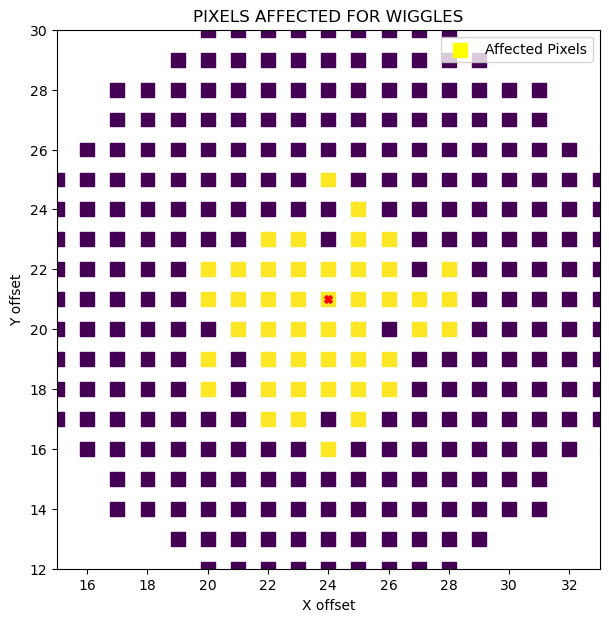

In [20]:
from FIndWiggles import define_affected_pixels
affected_pixels = define_affected_pixels(fit_wiggles_170lp,results,threshold=2.5)


# **STEP 3:** CORRECT WIGGLES
Now that we have identified spaxels affected by wiggles we can correct each pixel flagged. The resulting cube will be saved in the origin folder with the extension "wigglycorrected.fits"

Adding affected spaxels to multiprocessing.pool 


 ##### START WIGGLE CORRECTION ##### 

Correcting wiggles on task: 0 of 46
Correcting wiggles on task: 1 of 46
Correcting wiggles on task: 2 of 46
Correcting wiggles on task: 3 of 46
Correcting wiggles on task: 4 of 46
Correcting wiggles on task: 5 of 46
Correcting wiggles on task: 6 of 46
Correcting wiggles on task: 7 of 46
Correcting wiggles on task: 8 of 46
Correcting wiggles on task: 9 of 46
Correcting wiggles on task: 10 of 46
Correcting wiggles on task: 11 of 46
Correcting wiggles on task: 12 of 46
Correcting wiggles on task: 13 of 46
Correcting wiggles on task: 14 of 46
Correcting wiggles on task: 15 of 46
Correcting wiggles on task: 16 of 46
Correcting wiggles on task: 17 of 46
Correcting wiggles on task: 18 of 46
Correcting wiggles on task: 19 of 46
Correcting wiggles on task: 20 of 46
Correcting wiggles on task: 21 of 46
Correcting wiggles on task: 22 of 46
Correcting wiggles on task: 23 of 46
Correcting wiggles on task: 24 o

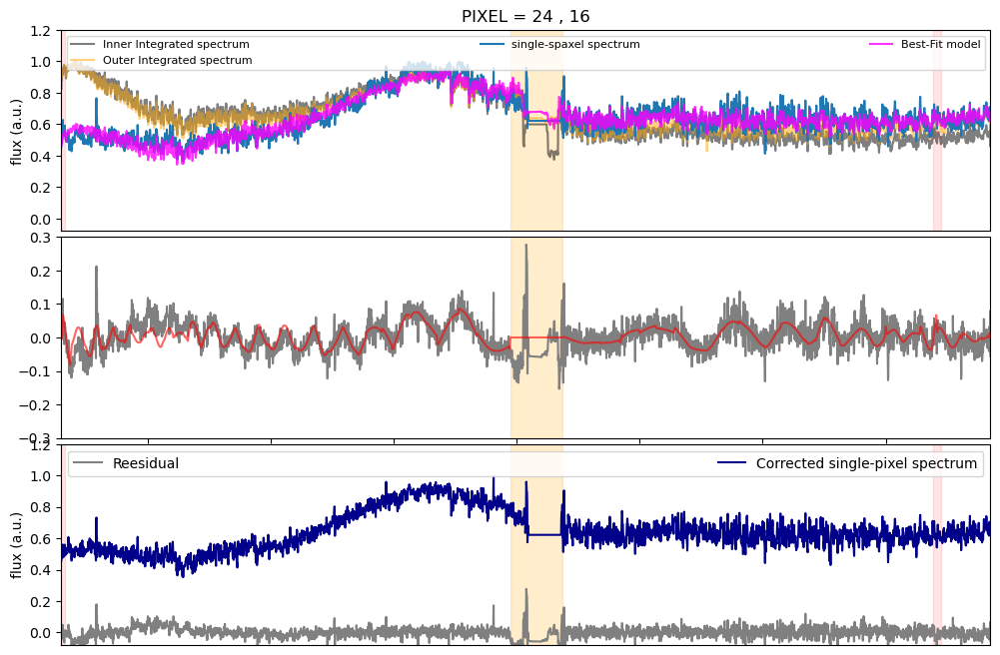

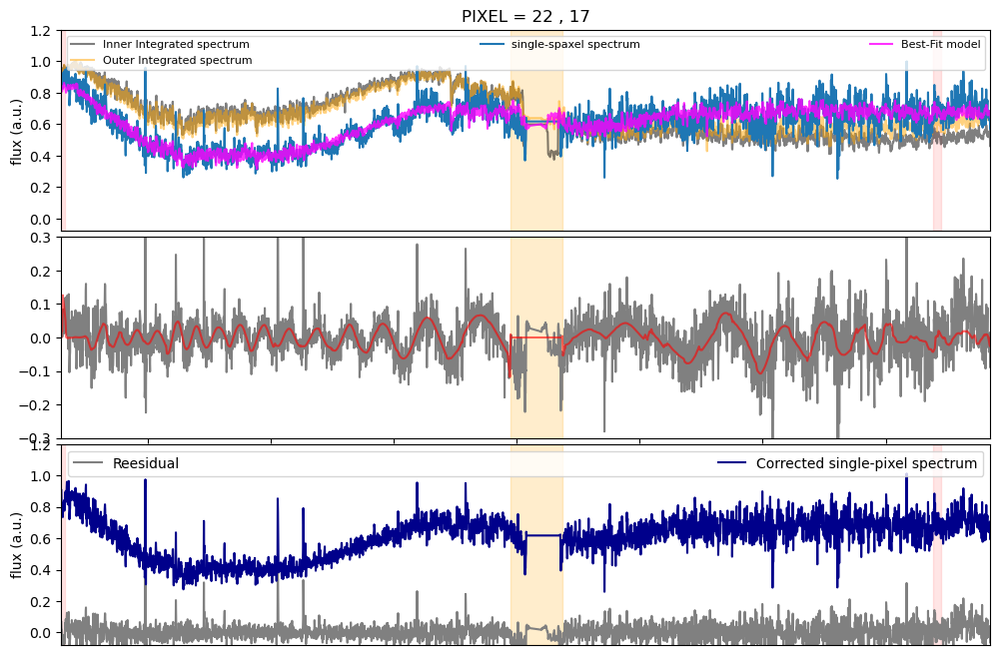

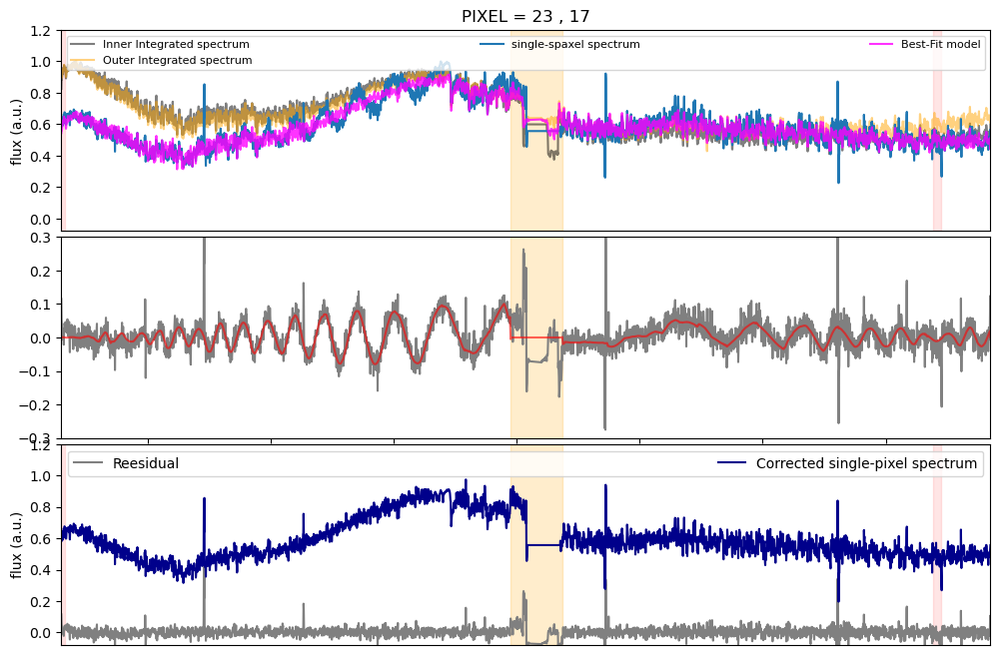

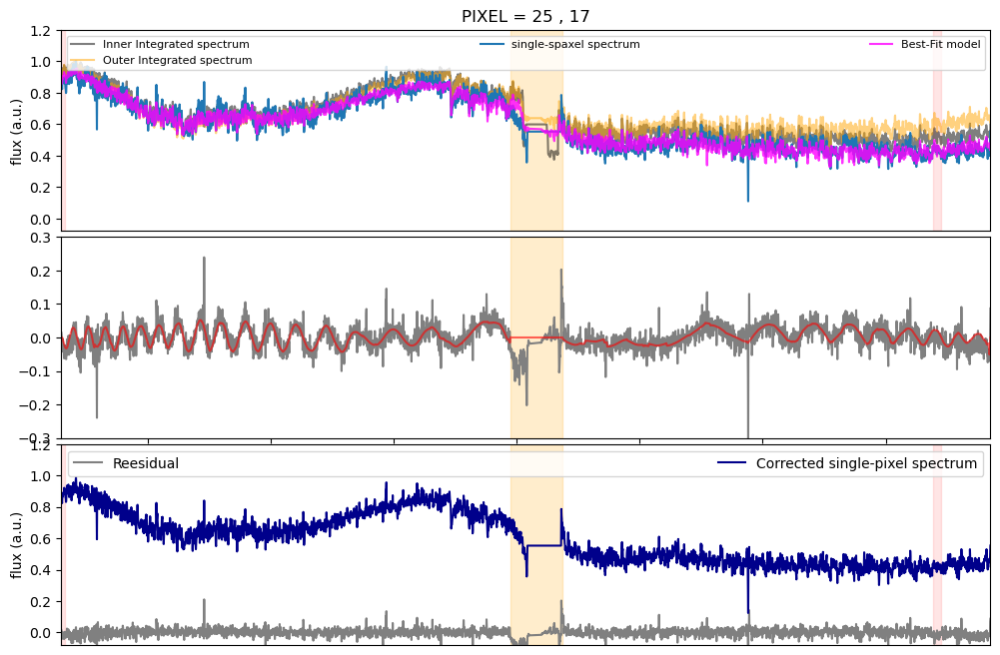

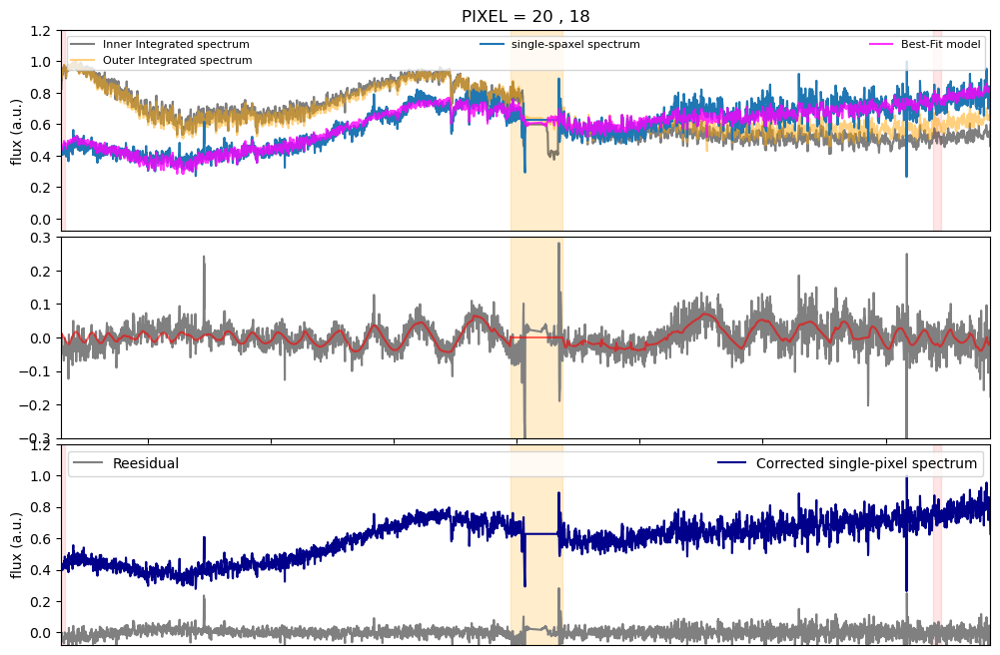

...

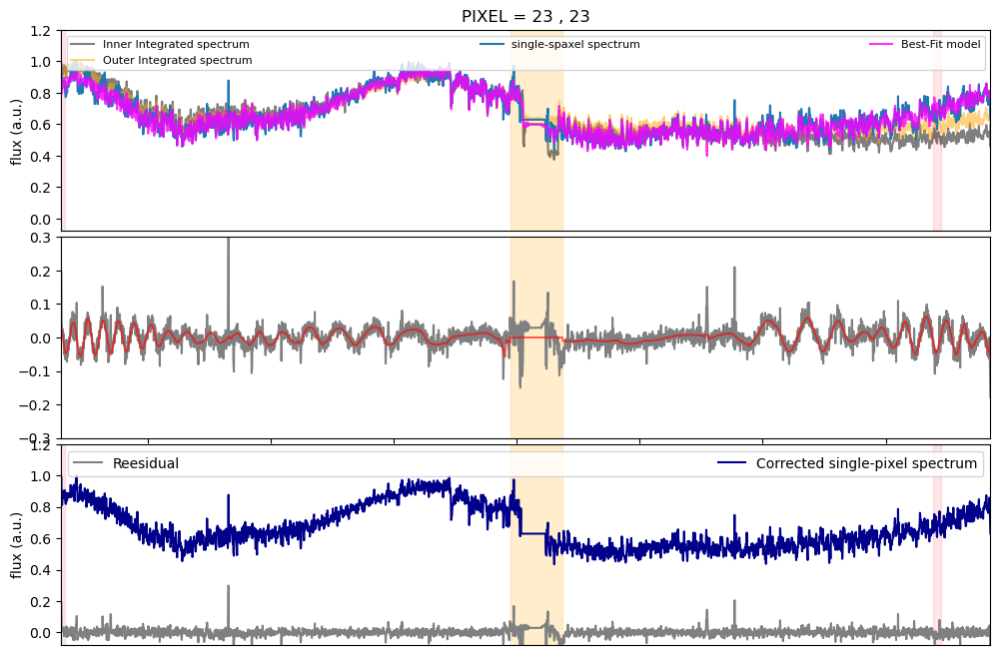

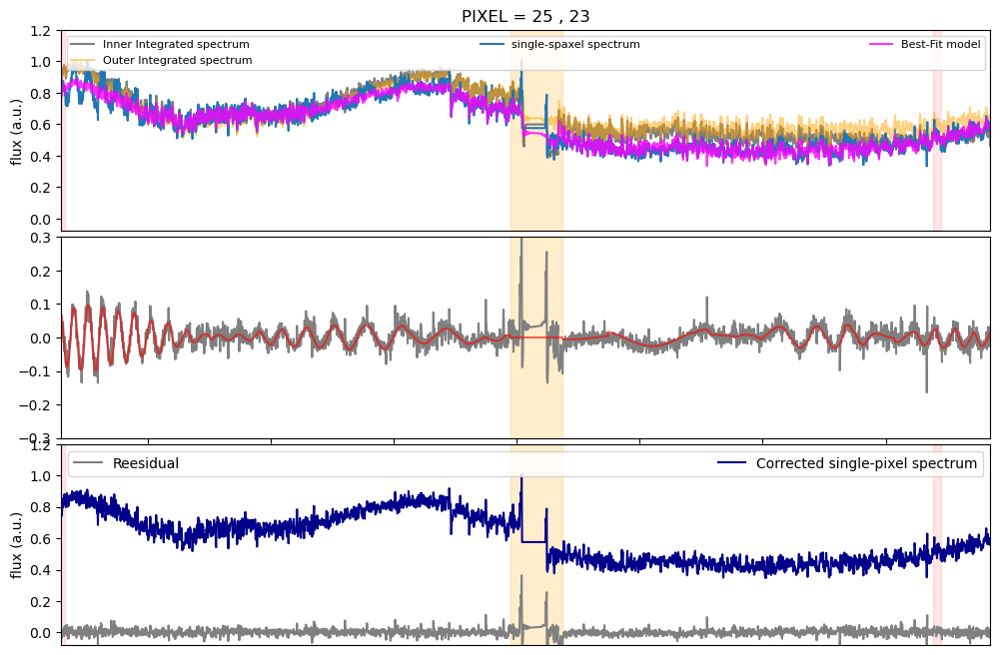

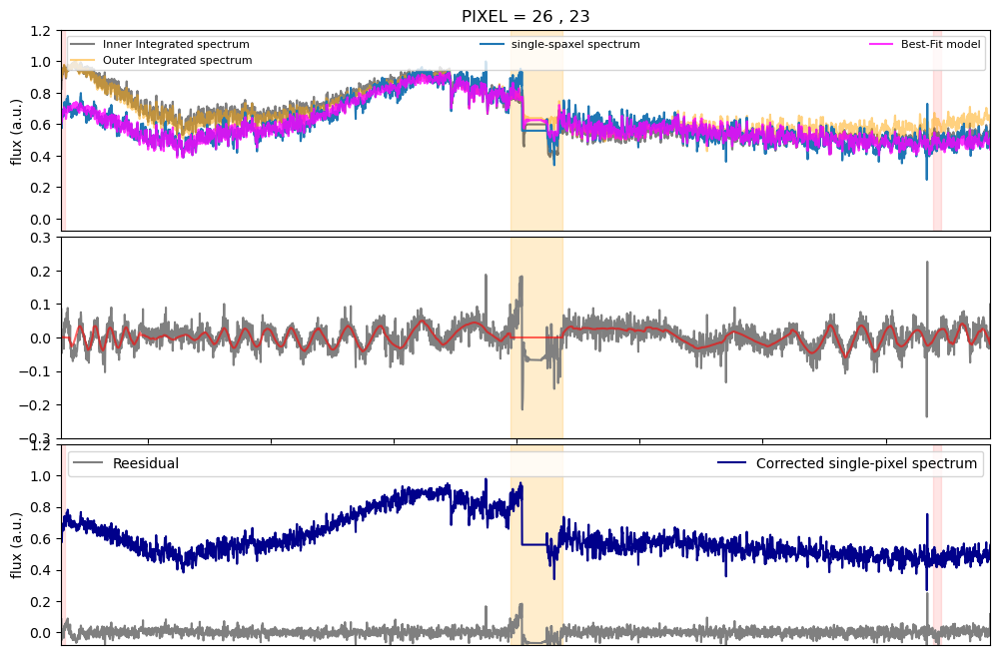

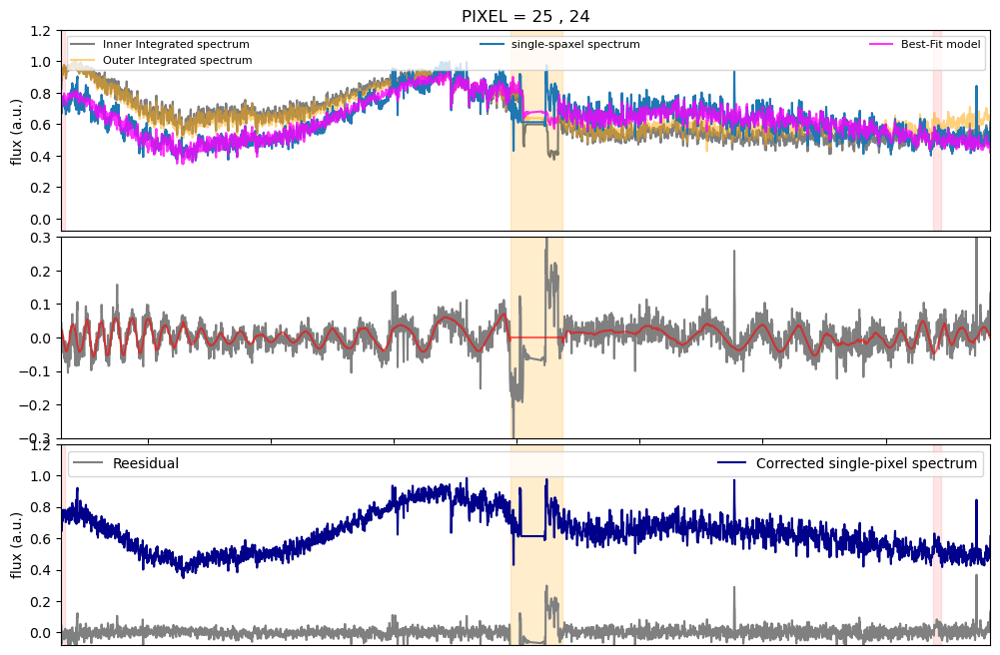

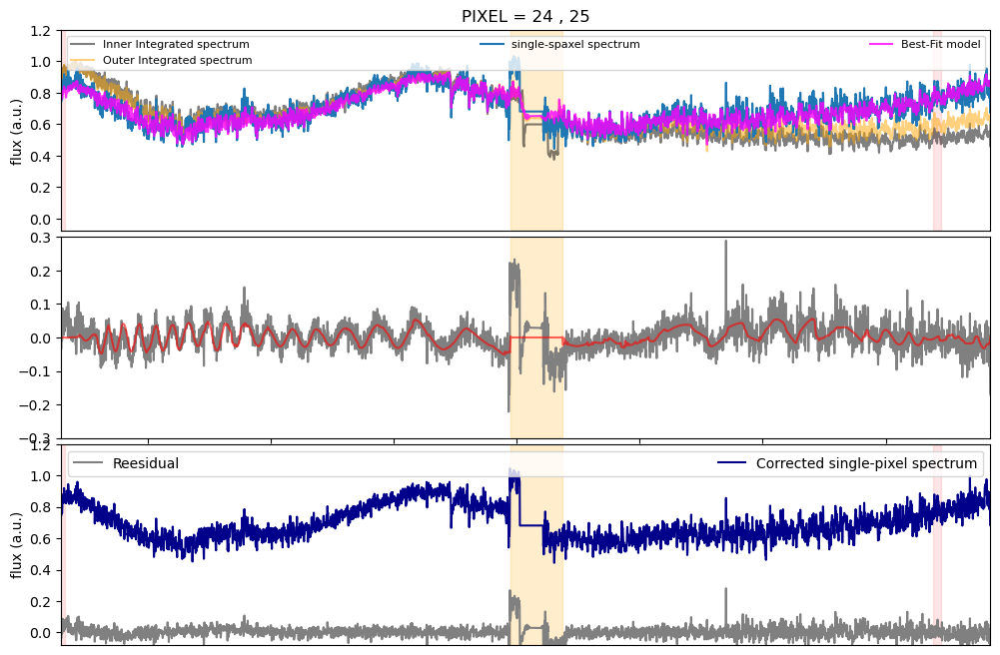

ADDING CORRECTED SPECTRA TO DATA CUBE 

DATA CUBE SAVED ON INPUT FOLDER, WITH NAME: /Users/dumont/Documents/ReveaLLGN/DATA/TWA-28/MAST_2024-07-24T2034/JWST/jw01270-o004_t003_nirspec_g235h-f170lp/jw01270-o004_t003_nirspec_g235h-f170lp_s3d_wigglycorrected.fits 


 FINISHED!


In [21]:
from FitWiggles import fitwiggles
fitwiggles(fit_wiggles_170lp,affected_pixels,N_rep=15,N_Cores=7,do_plots=True)